In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
data=pd.read_csv("F:\\thesis\\diabetes\kaggle_diabetes.csv")

In [3]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,2,138,62,35,0,33.6,0.127,47,1
1,0,84,82,31,125,38.2,0.233,23,0
2,0,145,0,0,0,44.2,0.630,31,1
3,0,135,68,42,250,42.3,0.365,24,1
4,1,139,62,41,480,40.7,0.536,21,0
...,...,...,...,...,...,...,...,...,...
1995,2,75,64,24,55,29.7,0.370,33,0
1996,8,179,72,42,130,32.7,0.719,36,1
1997,6,85,78,0,0,31.2,0.382,42,0
1998,0,129,110,46,130,67.1,0.319,26,1


In [4]:
df_new=data.rename(columns={"Pregnancies":"Preg",'Glucose':'Glu','BloodPressure':'BP','SkinThickness':'ST','Insulin':'Ins','DiabetesPedigreeFunction':'DPF'})

In [5]:
df_new

,Preg,Glu,BP,ST,Ins,BMI,DPF,Age,Outcome
0,2,138,62,35,0,33.6,0.127,47,1
1,0,84,82,31,125,38.2,0.233,23,0
2,0,145,0,0,0,44.2,0.630,31,1
3,0,135,68,42,250,42.3,0.365,24,1
4,1,139,62,41,480,40.7,0.536,21,0
...,...,...,...,...,...,...,...,...,...
1995,2,75,64,24,55,29.7,0.370,33,0
1996,8,179,72,42,130,32.7,0.719,36,1
1997,6,85,78,0,0,31.2,0.382,42,0
1998,0,129,110,46,130,67.1,0.319,26,1


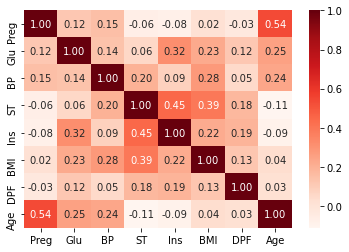

In [7]:
data_c1=df_new[['Preg', 'Glu', 'BP', 'ST', 'Ins',
       'BMI', 'DPF', 'Age',]]
plt.figure(figsize=(6,4))
sns.heatmap(data_c1.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

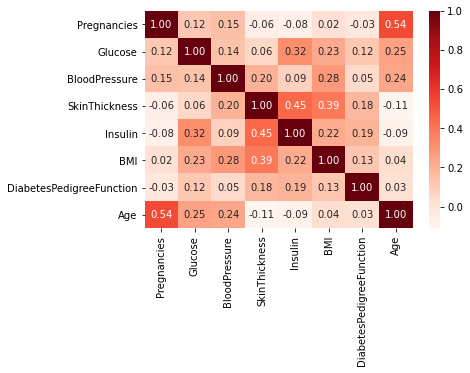

In [4]:
data_c=data[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age',]]
plt.figure(figsize=(6,4))
sns.heatmap(data_c.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,2000.0,3.70350,3.306063,0.000,1.000,3.000,6.000,17.00
Glucose,2000.0,121.18250,32.068636,0.000,99.000,117.000,141.000,199.00
BloodPressure,2000.0,69.14550,19.188315,0.000,63.500,72.000,80.000,122.00
SkinThickness,2000.0,20.93500,16.103243,0.000,0.000,23.000,32.000,110.00
Insulin,2000.0,80.25400,111.180534,0.000,0.000,40.000,130.000,744.00
BMI,2000.0,32.19300,8.149901,0.000,27.375,32.300,36.800,80.60
DiabetesPedigreeFunction,2000.0,0.47093,0.323553,0.078,0.244,0.376,0.624,2.42
Age,2000.0,33.09050,11.786423,21.000,24.000,29.000,40.000,81.00
Outcome,2000.0,0.34200,0.474498,0.000,0.000,0.000,1.000,1.00


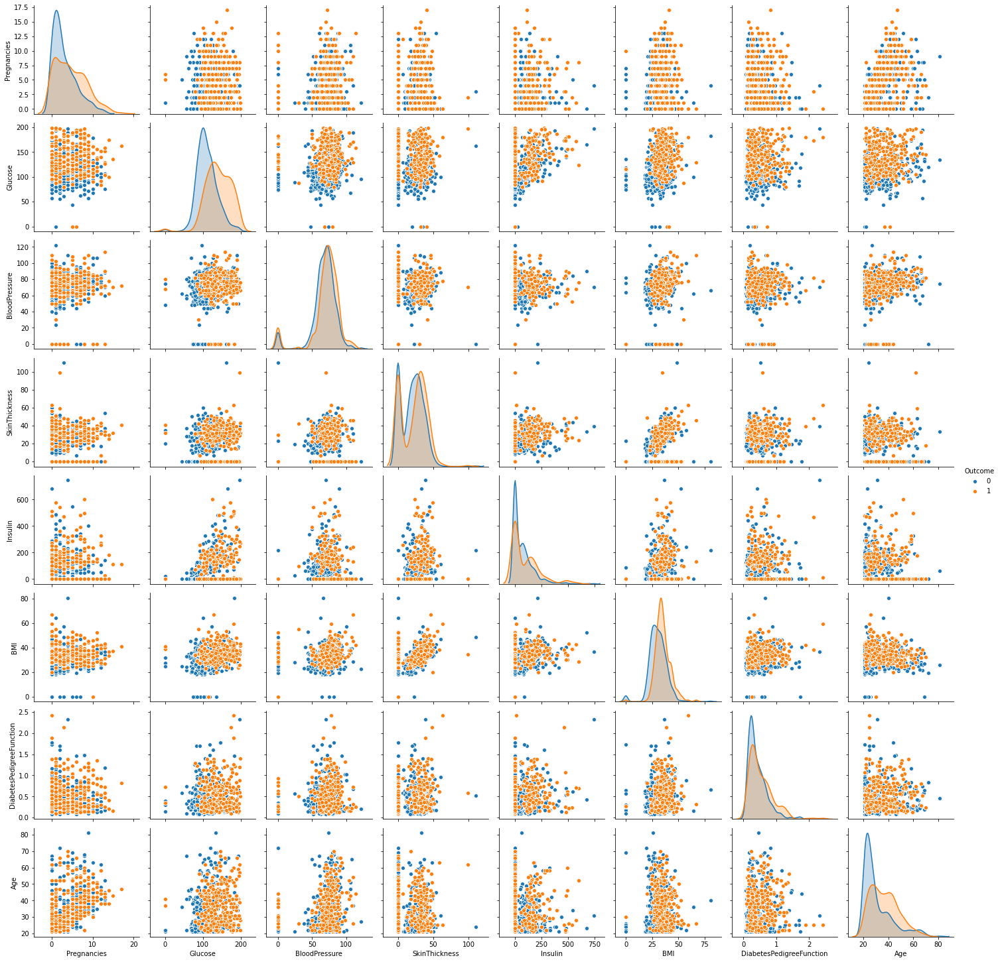

In [6]:
# pairplot for data distribution and outcome variable importance
sns.pairplot(data, hue= 'Outcome',)
plt.show()

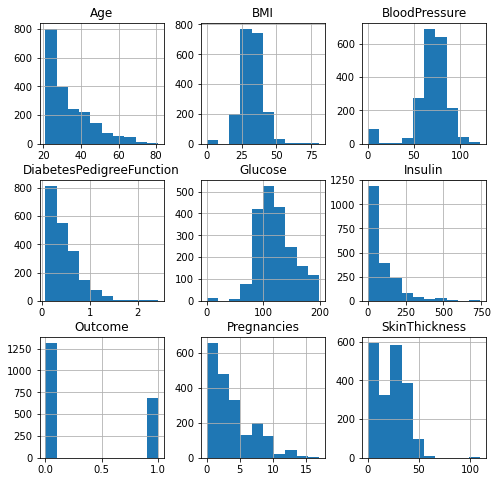

In [7]:
# for data distributions
data.hist(figsize= (8,8))
plt.show()

In [4]:
# checking for zero variables
data.isin([0]).sum()

Pregnancies                  301
Glucose                       13
BloodPressure                 90
SkinThickness                573
Insulin                      956
BMI                           28
DiabetesPedigreeFunction       0
Age                            0
Outcome                     1316
dtype: int64

In [5]:
data.isin([np.NaN]).any()

Pregnancies                 False
Glucose                     False
BloodPressure               False
SkinThickness               False
Insulin                     False
BMI                         False
DiabetesPedigreeFunction    False
Age                         False
Outcome                     False
dtype: bool

In [6]:
# Replacing the 0 values from ['Glucose','BloodPressure','SkinThickness','Insulin','BMI'] by NaN
df_copy = data.copy(deep=True)
df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)
df_copy.isnull().sum()

Pregnancies                   0
Glucose                      13
BloodPressure                90
SkinThickness               573
Insulin                     956
BMI                          28
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [7]:
# Replacing NaN value by mean, median depending upon distribution

attributes = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI']

for i in attributes:
    if i in ['Glucose','BloodPressure']:
        df_copy[i].fillna(df_copy[i].mean(), inplace = True)
    else :
        df_copy[i].fillna(df_copy[i].median(), inplace = True)
        
# check for NaN values 
df_copy.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [8]:
# Replacing NaN value by mean, median depending upon distribution

attributes = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI']

for i in attributes:
    if i in ['Glucose','BloodPressure']:
        df_copy[i].fillna(df_copy[i].mean(), inplace = True)
    else :
        df_copy[i].fillna(df_copy[i].median(), inplace = True)
        
# check for NaN values 
df_copy.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

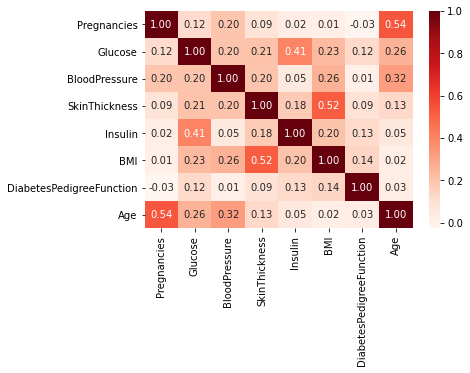

In [9]:
df_copy_c=df_copy[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age',]]
plt.figure(figsize=(6,4))
sns.heatmap(df_copy_c.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

In [14]:
df_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,2000.0,3.703500,3.306063,0.000,1.000,3.000,6.000,17.00
Glucose,2000.0,121.975340,30.533114,44.000,99.000,118.000,141.000,199.00
BloodPressure,2000.0,72.403665,11.949531,24.000,64.000,72.000,80.000,122.00
SkinThickness,2000.0,29.243500,9.124957,7.000,25.000,29.000,32.000,110.00
Insulin,2000.0,140.482000,81.562840,14.000,120.000,126.000,130.000,744.00
BMI,2000.0,32.646600,7.190196,18.200,27.600,32.400,36.800,80.60
DiabetesPedigreeFunction,2000.0,0.470930,0.323553,0.078,0.244,0.376,0.624,2.42
Age,2000.0,33.090500,11.786423,21.000,24.000,29.000,40.000,81.00
Outcome,2000.0,0.342000,0.474498,0.000,0.000,0.000,1.000,1.00


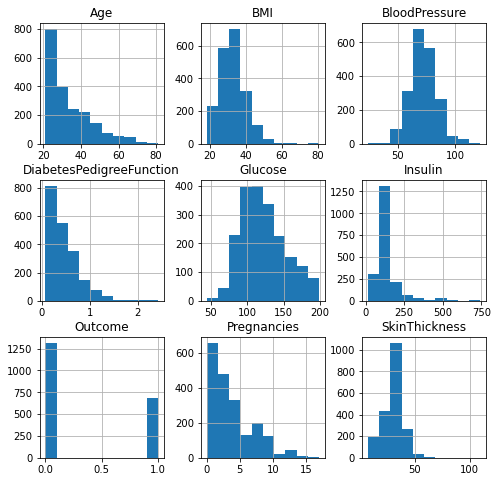

In [15]:
df_copy.hist(figsize=(8,8))
plt.show()

In [16]:
def target(dataframe, target):
    f, ax = plt.subplots(1, 2, figsize=(8,6))
    dataframe[target].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.2f%%', ax=ax[0], shadow=True)
    ax[0].set_title(target + ' Distribution')
    ax[0].set_ylabel('')
    sns.countplot(target, data=dataframe, ax=ax[1])
    ax[1].set_title(target + " Count Plot")
    plt.show()

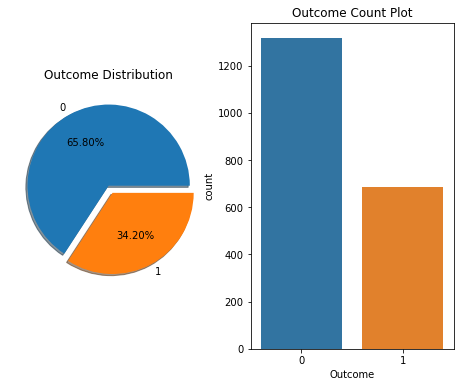

In [17]:
target(df_copy, "Outcome")

# Numerical Feature Analysis

In [18]:
import plotly.express as px
#import chart_studio.plotly as px

In [19]:
def feature_analysis (dataframe):
    for col in dataframe[:9]:
        fig = px.histogram(
        dataframe, x=col, color='Outcome',
        marginal='box', nbins=50,
        color_discrete_map={0: '#D62728', 1: '#3366CC'},
        barmode='overlay')
        fig.update_layout(height=600, width=800, 
        title_text='Diabetes Feature')
        fig.show()

In [20]:
feature_analysis(df_copy)

# Train and Test spliting

In [10]:
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler # scaling

In [11]:
X=df_copy[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y=df_copy['Outcome']

In [12]:
# splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state =125)

In [13]:
# scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [14]:
from sklearn.neighbors import KNeighborsClassifier

train_accuracy=[]
test_accuracy=[]
for n_neig in range(1,41,2):
    knn_model = KNeighborsClassifier(n_neighbors=n_neig)
    knn_model.fit(X_train,y_train)
    train_accuracy.append(knn_model.score(X_train,y_train))
    test_accuracy.append(knn_model.score(X_test,y_test))

In [15]:
frame=pd.DataFrame({'n_neighbors':range(1,41,2),'tarin_acc':train_accuracy,'test_acc':test_accuracy})
frame.head(22)

,n_neighbors,tarin_acc,test_acc
0,1,1.000000,0.9825
1,3,0.973125,0.8425
2,5,0.896250,0.8050
3,7,0.844375,0.8425
4,9,0.826250,0.8350
5,11,0.806250,0.8125
6,13,0.810000,0.8100
7,15,0.816875,0.8075
8,17,0.803750,0.7875
9,19,0.799375,0.7800


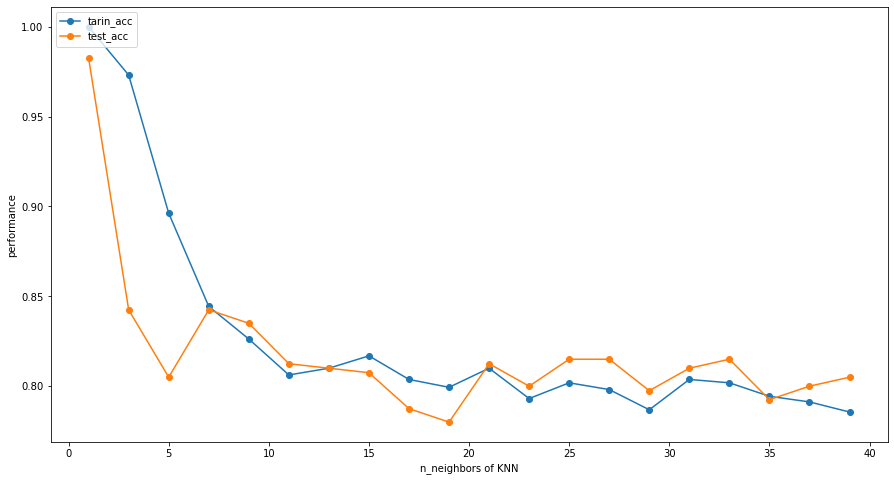

In [16]:
plt.figure(figsize=(15,8))
plt.plot(frame['n_neighbors'], frame['tarin_acc'], marker='o', label="tarin_acc")
plt.plot(frame['n_neighbors'], frame['test_acc'], marker='o',label="test_acc")
plt.ylabel('performance')
plt.xlabel('n_neighbors of KNN')
plt.legend(loc='upper left')

In [17]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=7) #using default value
knn=knn.fit(X_train, y_train)
y_predicted = knn.predict(X_test)

In [18]:
y_predicted

array([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,

In [19]:
#checking the Training score
KNN_trainScore=knn.score(X_train,y_train)
KNN_trainScore

0.844375

In [20]:
from sklearn.metrics import accuracy_score
knn_ac=accuracy_score(y_test,y_predicted)
knn_ac

0.8425

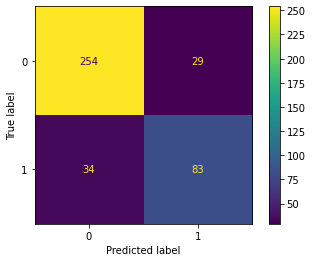

In [21]:
from sklearn.metrics import confusion_matrix,plot_confusion_matrix
#from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(knn, X_test, y_test)  
plt.show()

In [24]:
from sklearn.metrics import accuracy_score,f1_score, precision_score, recall_score 
from sklearn.metrics import classification_report
#from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
# precision tp / (tp + fp)
knn_precision = precision_score(y_test, y_predicted)
print('Precision: %f' % knn_precision)
# recall: tp / (tp + fn)
knn_recall = recall_score(y_test, y_predicted)
print('Recall: %f' % knn_recall)
# f1: 2 tp / (2 tp + fp + fn)
knn_f1 = f1_score(y_test, y_predicted)
print('F1 score: %f' % knn_f1)

Precision: 0.741071
Recall: 0.709402
F1 score: 0.724891


In [27]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
knn_MAE=mean_absolute_error(y_test, y_predicted)
print("Mean Absolute Error:",knn_MAE)

knn_MSE=mean_squared_error(y_test, y_predicted)
print("Mean Squared Error",knn_MSE)

#the root mean squared error
knn_rmse = mean_squared_error(y_test, y_predicted, squared = False)
print('Root Mean Squared Error: %.3f' % knn_rmse)

Mean Absolute Error: 0.1575
Mean Squared Error 0.1575
Root Mean Squared Error: 0.397


# Decision Tree classifier

In [29]:
from sklearn.metrics import confusion_matrix,plot_confusion_matrix 
from sklearn import tree
from sklearn.metrics import accuracy_score,f1_score, precision_score, recall_score 
from sklearn.metrics import classification_report

# Changing Max Depth

In [26]:
train_accuracy=[]
test_accuracy=[]
for depth in range(1,22):
    dt_model=tree.DecisionTreeClassifier(max_depth=depth, random_state=125)
    dt_model.fit(X_train,y_train)
    train_accuracy.append(dt_model.score(X_train,y_train))
    test_accuracy.append(dt_model.score(X_test,y_test))

In [27]:
frame=pd.DataFrame({'max_depth':range(1,22),'tarin_acc':train_accuracy,'test_acc':test_accuracy})
frame.head(22)

,max_depth,tarin_acc,test_acc
0,1,0.733125,0.7400
1,2,0.766250,0.7825
2,3,0.775625,0.7825
3,4,0.790625,0.7875
4,5,0.836250,0.8400
5,6,0.853125,0.8375
6,7,0.880625,0.8700
7,8,0.916875,0.9075
8,9,0.949375,0.9375
9,10,0.971875,0.9550


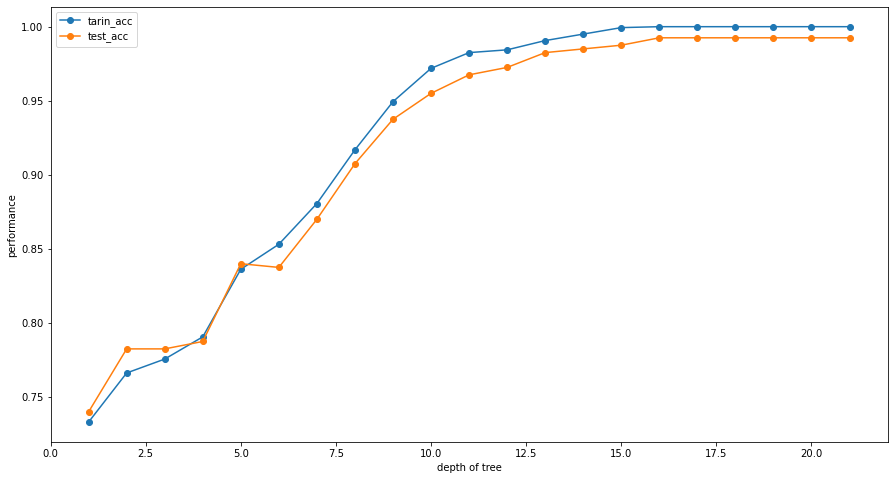

In [28]:
plt.figure(figsize=(15,8))
plt.plot(frame['max_depth'], frame['tarin_acc'], marker='o', label="tarin_acc")
plt.plot(frame['max_depth'], frame['test_acc'], marker='o',label="test_acc")
plt.ylabel('performance')
plt.xlabel('depth of tree')
plt.legend(loc='upper left')

# Feature Importance for base Model

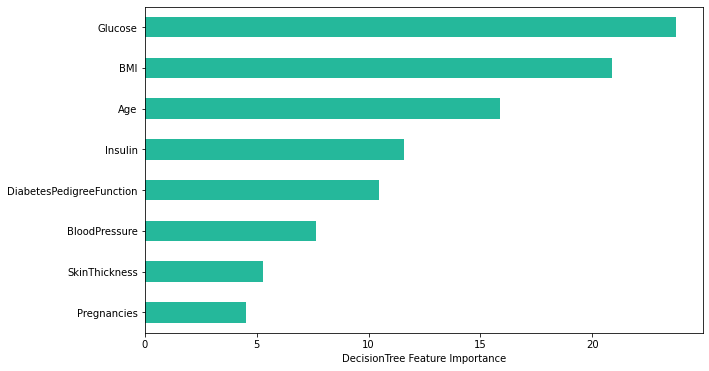

In [29]:
Importance = pd.DataFrame({'Importance':tree.DecisionTreeClassifier(splitter='best',criterion='entropy',
                        max_depth=16).fit(X, y).feature_importances_*100}, index = X.columns)

Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', color = '#25B89B', figsize=(10,6))

plt.xlabel('DecisionTree Feature Importance')
plt.gca().legend_ = None

In [30]:
# decision tree evaluation
DT_clf=tree.DecisionTreeClassifier(splitter='best',criterion='entropy',max_depth=16)

In [31]:
DT_clf=DT_clf.fit(X_train,y_train)

In [32]:
#checking the Training score
DT_trainScore=DT_clf.score(X_train,y_train)
DT_trainScore

0.99875

In [33]:
DT_y_pred=DT_clf.predict(X_test)
#print(DT_y_pred)

In [34]:
DT_AC=accuracy_score(y_test,DT_y_pred)
DT_AC

0.99

In [35]:
# check for model scores as part of model evalution
print("training score: {} and test score: {} ".format(DT_clf.score(X_train, y_train), DT_clf.score(X_test, y_test)))

training score: 0.99875 and test score: 0.99 


In [36]:
# model metrics for classification problem
DT_cm = confusion_matrix(y_test, DT_y_pred)
print(DT_cm)

[[281   2]
 [  2 115]]


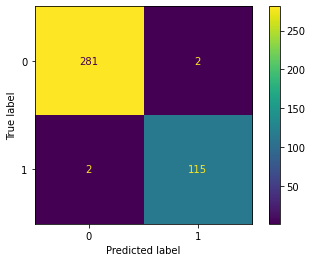

In [37]:
#from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(DT_clf, X_test, y_test)  
plt.show()

In [38]:
# classification report
DT_cr=classification_report(y_test, DT_y_pred)
print(DT_cr)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       283
           1       0.98      0.98      0.98       117

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



In [39]:
#from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
# precision tp / (tp + fp)
precision = precision_score(y_test, DT_y_pred)
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(y_test, DT_y_pred)
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, DT_y_pred)
print('F1 score: %f' % f1)

Precision: 0.982906
Recall: 0.982906
F1 score: 0.982906


In [40]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

DT_MAE=mean_absolute_error(y_test, DT_y_pred)
print("Mean Absolute Error:", DT_MAE)

DT_MSE=mean_squared_error(y_test, DT_y_pred)
print("Mean Square Error:", DT_MSE)

#the root mean squared error
DT_rmse = mean_squared_error(y_test, DT_y_pred, squared = False)
print("Root Mean Square Error:", DT_rmse)

Mean Absolute Error: 0.01
Mean Square Error: 0.01
Root Mean Square Error: 0.1


# Tree Visualization

In [41]:
text_representation = tree.export_text(DT_clf)
print(text_representation)

|--- feature_1 <= 0.16
|   |--- feature_5 <= -0.87
|   |   |--- feature_4 <= -1.16
|   |   |   |--- feature_6 <= 0.54
|   |   |   |   |--- class: 0
|   |   |   |--- feature_6 >  0.54
|   |   |   |   |--- class: 1
|   |   |--- feature_4 >  -1.16
|   |   |   |--- class: 0
|   |--- feature_5 >  -0.87
|   |   |--- feature_7 <= -0.41
|   |   |   |--- feature_3 <= -0.09
|   |   |   |   |--- feature_5 <= 0.01
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_5 >  0.01
|   |   |   |   |   |--- feature_4 <= -1.19
|   |   |   |   |   |   |--- feature_4 <= -1.34
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_4 >  -1.34
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_4 >  -1.19
|   |   |   |   |   |   |--- feature_6 <= 1.08
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_6 >  1.08
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_3 >  -0.09
|   |   |   |   |--- feature_5 <= 1.75


In [42]:
feature_names=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']
#feature_names

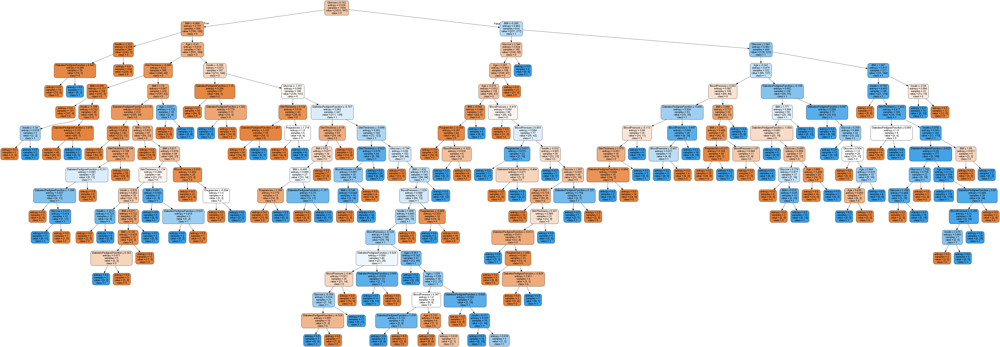

In [43]:
from sklearn.tree import export_graphviz
from io import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(DT_clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_names,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DT_Tree.png')
Image(graph.create_png())

# Test New DataSet

In [44]:
df=pd.read_csv(r"F:\\thesis\\diabetes\test_diabetes_m.csv")
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63
764,2,122.0,70.0,27.0,125.0,36.8,0.340,27
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30
766,1,126.0,60.0,29.0,125.0,30.1,0.349,47


In [45]:
new_df= sc.transform(df)

In [46]:
P=DT_clf.predict(new_df)
print(P)

[1 0 1 0 0 0 0 1 0 0 0 1 1 0 1 1 1 1 0 0 1 0 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0
 1 1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1
 1 0 0 1 1 1 0 0 0 1 0 0 0 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1 0 0 0 0 0
 1 1 1 1 1 0 0 1 1 0 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 1 1 0 1 1 1 1
 0 0 0 0 0 1 0 0 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0
 1 0 1 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 1 1 1 0 0
 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 0 0 1
 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1 1 0 0 1 0 0 1 0 0 1
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 0 1 1 0 1 0 1 0 1
 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1
 1 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 1 1 0 0 0 0 0 0 0 

In [47]:
c=0
for x in range(len(P)):
    if P[x]==1:
        #print(p[x])
        c=c+1
print(c)

266


In [48]:
new_df_=pd.DataFrame([[0,99,70,30,70,26,0.8,40],[7,100,72.4,29,125,30,0.484,32,],[9,119,80,35,125,29,0.263,29],
                      [1,97,66,15,140,23.2,0.487,22],[0,180,66,39,125,42,1.893,25]],
                    columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
      'BMI', 'DiabetesPedigreeFunction', 'Age'])
new_df_

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0,99,70.0,30,70,26.0,0.800,40
1,7,100,72.4,29,125,30.0,0.484,32
2,9,119,80.0,35,125,29.0,0.263,29
3,1,97,66.0,15,140,23.2,0.487,22
4,0,180,66.0,39,125,42.0,1.893,25


In [49]:
new_df_1= sc.transform(new_df_)
p_=DT_clf.predict(new_df_1)
print(p_)

[0 1 1 0 1]


In [50]:
#df_1=pd.read_csv(r"F:\\thesis\\diabetes\\archive\diabetes.csv")

In [51]:
#df_1['Outcome'].value_counts()

In [52]:
#df_2=df_1[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]

In [53]:
#new_df1= sc.transform(df_2)

In [54]:
#P1=DT_clf.predict(new_df1)

In [55]:
#print(P1)

In [56]:
#c=0
#for x in range(len(P1)):
#    if P1[x]==1:
        #print(p[x])
#        c=c+1
#print(c)

In [57]:
# checking for zero variables
#df_2.isin([0]).sum()

In [58]:
#df_2.isin([np.NaN]).any()

In [59]:
# Replacing the 0 values from ['Glucose','BloodPressure','SkinThickness','Insulin','BMI'] by NaN
#df_2_copy = df_2.copy(deep=True)
#df_2_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df_2_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)
#df_2_copy.isnull().sum()

In [60]:
# Replacing NaN value by mean, median depending upon distribution

#attributes = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI']

#for i in attributes:
#    if i in ['Glucose','BloodPressure']:
#        df_2_copy[i].fillna(df_copy[i].mean(), inplace = True)
#    else :
#        df_2_copy[i].fillna(df_copy[i].median(), inplace = True)
        
## check for NaN values 
#df_2_copy.isna().sum()

In [61]:
#new_df2= sc.transform(df_2_copy)
#P2=DT_clf.predict(new_df2)
#print(P2)

In [62]:
#c=0
#for x in range(len(P2)):
#    if P2[x]==1:
#        #print(p[x])
#        c=c+1
#print(c)

# Random Forest Classifier

In [41]:
from sklearn.ensemble import RandomForestClassifier

# Changing n_estimator and Max depth

In [64]:
for estimator in range(1,50):
    for depth in range(1,20):
        RF_model=RandomForestClassifier(n_estimators=estimator, max_depth=depth, random_state= 0, n_jobs= -1)
        RF_model.fit(X_train,y_train)
        train_accuracy=RF_model.score(X_train,y_train)
        test_accuracy=RF_model.score(X_test,y_test)
        print("n_estimators: {} , max depth: {} , tarin_acc: {} , test_acc: {} ".format(estimator,depth,train_accuracy,test_accuracy))

n_estimators: 1 , max depth: 1 , tarin_acc: 0.645625 , test_acc: 0.7075 
n_estimators: 1 , max depth: 2 , tarin_acc: 0.68875 , test_acc: 0.685 
n_estimators: 1 , max depth: 3 , tarin_acc: 0.74625 , test_acc: 0.7575 
n_estimators: 1 , max depth: 4 , tarin_acc: 0.756875 , test_acc: 0.7375 
n_estimators: 1 , max depth: 5 , tarin_acc: 0.78375 , test_acc: 0.7725 
n_estimators: 1 , max depth: 6 , tarin_acc: 0.793125 , test_acc: 0.7975 
n_estimators: 1 , max depth: 7 , tarin_acc: 0.79375 , test_acc: 0.79 
n_estimators: 1 , max depth: 8 , tarin_acc: 0.841875 , test_acc: 0.8225 
n_estimators: 1 , max depth: 9 , tarin_acc: 0.88625 , test_acc: 0.8425 
n_estimators: 1 , max depth: 10 , tarin_acc: 0.89125 , test_acc: 0.8375 
n_estimators: 1 , max depth: 11 , tarin_acc: 0.94125 , test_acc: 0.8725 
n_estimators: 1 , max depth: 12 , tarin_acc: 0.93 , test_acc: 0.8725 
n_estimators: 1 , max depth: 13 , tarin_acc: 0.953125 , test_acc: 0.9075 
n_estimators: 1 , max depth: 14 , tarin_acc: 0.968125 , test_

n_estimators: 7 , max depth: 3 , tarin_acc: 0.79 , test_acc: 0.81 
n_estimators: 7 , max depth: 4 , tarin_acc: 0.811875 , test_acc: 0.8125 
n_estimators: 7 , max depth: 5 , tarin_acc: 0.833125 , test_acc: 0.825 
n_estimators: 7 , max depth: 6 , tarin_acc: 0.875 , test_acc: 0.865 
n_estimators: 7 , max depth: 7 , tarin_acc: 0.906875 , test_acc: 0.8875 
n_estimators: 7 , max depth: 8 , tarin_acc: 0.945625 , test_acc: 0.93 
n_estimators: 7 , max depth: 9 , tarin_acc: 0.958125 , test_acc: 0.925 
n_estimators: 7 , max depth: 10 , tarin_acc: 0.979375 , test_acc: 0.93 
n_estimators: 7 , max depth: 11 , tarin_acc: 0.98625 , test_acc: 0.955 
n_estimators: 7 , max depth: 12 , tarin_acc: 0.993125 , test_acc: 0.945 
n_estimators: 7 , max depth: 13 , tarin_acc: 0.9975 , test_acc: 0.975 
n_estimators: 7 , max depth: 14 , tarin_acc: 0.998125 , test_acc: 0.9775 
n_estimators: 7 , max depth: 15 , tarin_acc: 0.998125 , test_acc: 0.9775 
n_estimators: 7 , max depth: 16 , tarin_acc: 0.998125 , test_acc: 0

n_estimators: 13 , max depth: 6 , tarin_acc: 0.8875 , test_acc: 0.88 
n_estimators: 13 , max depth: 7 , tarin_acc: 0.916875 , test_acc: 0.885 
n_estimators: 13 , max depth: 8 , tarin_acc: 0.949375 , test_acc: 0.9325 
n_estimators: 13 , max depth: 9 , tarin_acc: 0.97 , test_acc: 0.94 
n_estimators: 13 , max depth: 10 , tarin_acc: 0.98625 , test_acc: 0.935 
n_estimators: 13 , max depth: 11 , tarin_acc: 0.9975 , test_acc: 0.975 
n_estimators: 13 , max depth: 12 , tarin_acc: 0.998125 , test_acc: 0.965 
n_estimators: 13 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 13 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 13 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.9775 
n_estimators: 13 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 13 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 13 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 13 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9875 


n_estimators: 19 , max depth: 7 , tarin_acc: 0.914375 , test_acc: 0.89 
n_estimators: 19 , max depth: 8 , tarin_acc: 0.95625 , test_acc: 0.935 
n_estimators: 19 , max depth: 9 , tarin_acc: 0.976875 , test_acc: 0.96 
n_estimators: 19 , max depth: 10 , tarin_acc: 0.99 , test_acc: 0.9625 
n_estimators: 19 , max depth: 11 , tarin_acc: 0.99625 , test_acc: 0.975 
n_estimators: 19 , max depth: 12 , tarin_acc: 0.998125 , test_acc: 0.97 
n_estimators: 19 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 19 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 19 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.9775 
n_estimators: 19 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 19 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 19 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9775 
n_estimators: 19 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9775 
n_estimators: 20 , max depth: 1 , tarin_acc: 0.645625 , test_acc: 0.7075

n_estimators: 25 , max depth: 9 , tarin_acc: 0.975625 , test_acc: 0.95 
n_estimators: 25 , max depth: 10 , tarin_acc: 0.988125 , test_acc: 0.9625 
n_estimators: 25 , max depth: 11 , tarin_acc: 0.99375 , test_acc: 0.9675 
n_estimators: 25 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.965 
n_estimators: 25 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 25 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 25 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.9775 
n_estimators: 25 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 25 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 25 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 25 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 26 , max depth: 1 , tarin_acc: 0.645625 , test_acc: 0.7075 
n_estimators: 26 , max depth: 2 , tarin_acc: 0.74375 , test_acc: 0.7575 
n_estimators: 26 , max depth: 3 , tarin_acc: 0.79 , test_acc: 0.8

n_estimators: 31 , max depth: 10 , tarin_acc: 0.98625 , test_acc: 0.96 
n_estimators: 31 , max depth: 11 , tarin_acc: 0.994375 , test_acc: 0.97 
n_estimators: 31 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 31 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 31 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.985 
n_estimators: 31 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 32 , max depth: 1 , tarin_acc: 0.650625 , test_acc: 0.715 
n_estimators: 32 , max depth: 2 , tarin_acc: 0.7525 , test_acc: 0.7575 
n_estimators: 32 , max depth: 3 , tarin_acc: 0.78875 , test_acc: 0.8025 
n_estimators: 32 , max depth: 4 , tarin_acc: 0.810625 , test_acc: 0.8

n_estimators: 37 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 37 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 37 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 15 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 37 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 38 , max depth: 1 , tarin_acc: 0.650625 , test_acc: 0.715 
n_estimators: 38 , max depth: 2 , tarin_acc: 0.753125 , test_acc: 0.7575 
n_estimators: 38 , max depth: 3 , tarin_acc: 0.80125 , test_acc: 0.8075 
n_estimators: 38 , max depth: 4 , tarin_acc: 0.81375 , test_acc: 0.8225 
n_estimators: 38 , max depth: 5 , tarin_acc: 0.8525 , test_acc: 0.8375 
n_estimators: 38 , max depth: 6 , tarin_acc: 0.899375 , test_acc: 0.88 

n_estimators: 49 , max depth: 13 , tarin_acc: 0.999375 , test_acc: 0.9825 
n_estimators: 49 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 49 , max depth: 15 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 49 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 49 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 49 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 49 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 


# Feature importantances for Random Forest

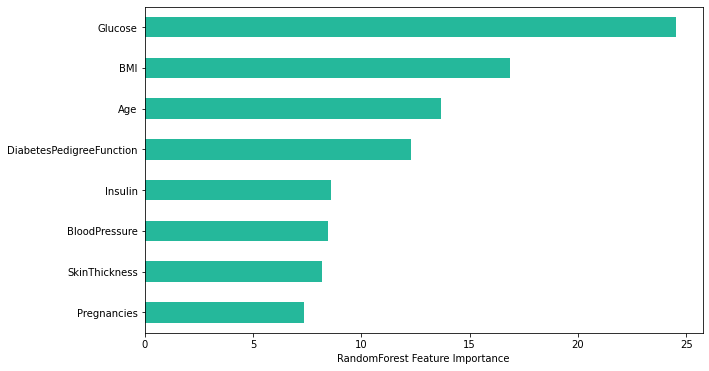

In [54]:
Importance = pd.DataFrame({'Importance':RandomForestClassifier(n_estimators=33,max_depth=15,
                        random_state= 0, n_jobs= -1).fit(X, y).feature_importances_*100},index = X.columns)

Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', color = '#25B89B', figsize=(10,6))

plt.xlabel('RandomForest Feature Importance')
plt.gca().legend_ = None

In [42]:
# from our observations randomforest is best fit
RF_clf = RandomForestClassifier(n_estimators=33,max_depth=15,random_state= 0, n_jobs= -1)

In [43]:
RF_clf=RF_clf.fit(X_train, y_train)

In [44]:
#checking the Training score
RF_trainScore=RF_clf.score(X_train,y_train)
RF_trainScore

1.0

In [45]:
# model predictions
RF_y_pred = RF_clf.predict(X_test)

In [46]:
#print(RF_y_pred)

In [47]:
# accuracy score
RF_AC=accuracy_score(y_test, RF_y_pred)
RF_AC

0.9875

In [48]:
# check for model scores as part of model evalution
print("training score: {} and test score: {} ".format(RF_clf.score(X_train, y_train), RF_clf.score(X_test, y_test)))

training score: 1.0 and test score: 0.9875 


Confusion Matrix:
 [[278   5]
 [  0 117]]


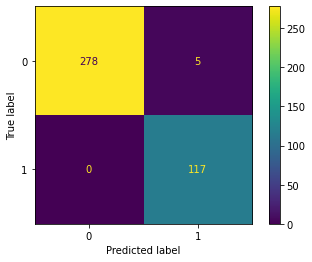

In [49]:
RF_cm = confusion_matrix(y_test, RF_y_pred)
print("Confusion Matrix:\n",RF_cm)
plot_confusion_matrix(RF_clf, X_test, y_test) 
plt.show()

In [50]:
# classification report
RF_cr=classification_report(y_test, RF_y_pred)
print(RF_cr)

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       283
           1       0.96      1.00      0.98       117

    accuracy                           0.99       400
   macro avg       0.98      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



In [51]:
# precision tp / (tp + fp)
RF_precision = precision_score(y_test, RF_y_pred)
print('Random Forest Precision: %f' % RF_precision)
# recall: tp / (tp + fn)
RF_recall = recall_score(y_test, RF_y_pred)
print('Random Forest Recall: %f' % RF_recall)
# f1: 2 tp / (2 tp + fp + fn)
RF_f1 = f1_score(y_test, RF_y_pred)
print('Random Forest F1 score: %f' % RF_f1)

Random Forest Precision: 0.959016
Random Forest Recall: 1.000000
Random Forest F1 score: 0.979079


In [52]:
RF_MAE=mean_absolute_error(y_test, RF_y_pred)
print("Mean Absolute Error:",RF_MAE)

RF_MSE=mean_squared_error(y_test, RF_y_pred)
print("Mean Squared Error",RF_MSE)

#the root mean squared error
RF_rmse = mean_squared_error(y_test, RF_y_pred, squared = False)
print('Root Mean Squared Error: %.3f' % RF_rmse)

Mean Absolute Error: 0.0125
Mean Squared Error 0.0125
Root Mean Squared Error: 0.112


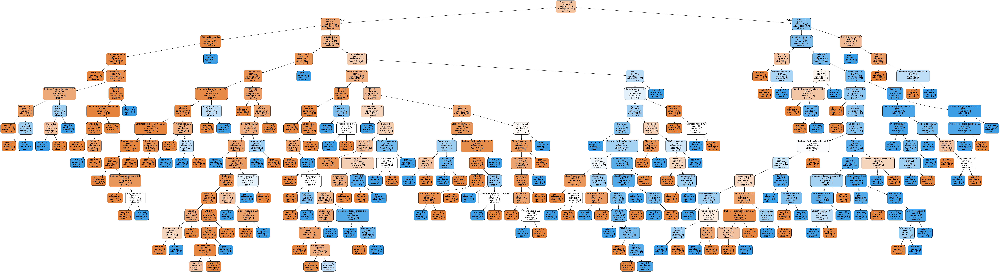

In [78]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
from io import StringIO  
from IPython.display import Image  
import pydotplus

# Pull out one tree from the forest
tree = RF_clf.estimators_[5]
dot_data = StringIO()

# Export the image to a dot file
export_graphviz(tree, out_file = dot_data, feature_names = feature_names,class_names=['0','1'],
                filled=True, rounded = True,special_characters=True, precision = 1)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Random_forest_tree.png')
Image(graph.create_png())

In [69]:
new_test = sc.transform(df)

In [70]:
p=RF_clf.predict(new_test)

In [71]:
c=0
for x in range(len(p)):
    if p[x]==1:
        #print(p[x])
        c=c+1
print(c)

266


# Algorithms Comparision

In [53]:
from tabulate import tabulate
models = pd.DataFrame({
                          'Model': ['Decision Tree',
                                    'Random Forest',
                                   'K Nearest Neighbor'],
#                           'Scoretrain': [DT_trainScore, 
#                                          RF_trainScore,],
                       
                          'scoretest':[DT_AC,
                                        RF_AC,
                                      knn_ac],
                        
                        'Mean_Absolute_Error':[
                            DT_MAE,
                            RF_MAE,
                            knn_MAE
                        ],
                        'Mean_Squared_Error':[
                            DT_MSE,
                            RF_MSE,
                            knn_MSE
                        ],
                        'Root_Mean_Squared_Error':[
                            DT_rmse,
                            RF_rmse,
                            knn_rmse,
                        ],
                        'Precision':[
                            precision,
                            RF_precision,
                           knn_precision
                        ],
                        'Recall':[
                            recall,
                            RF_recall,
                            knn_recall,
                        ],
                        'F1 score':[
                            f1,
                            RF_f1,
                            knn_f1,
                        ],
})
print("Comparision Between Decision Tree and Random Forest")               
print(tabulate(models , headers = ['Model' , 'Test Score/AC',
                                    'MAE','MSE','RMSE','Precision','Recall','F1 score'] , 
               tablefmt = 'psql' , showindex =False))

Comparision Between Decision Tree and Random Forest
+--------------------+-----------------+--------+--------+----------+-------------+----------+------------+
| Model              |   Test Score/AC |    MAE |    MSE |     RMSE |   Precision |   Recall |   F1 score |
|--------------------+-----------------+--------+--------+----------+-------------+----------+------------|
| Decision Tree      |          0.99   | 0.01   | 0.01   | 0.1      |    0.982906 | 0.982906 |   0.982906 |
| Random Forest      |          0.9875 | 0.0125 | 0.0125 | 0.111803 |    0.959016 | 1        |   0.979079 |
| K Nearest Neighbor |          0.8425 | 0.1575 | 0.1575 | 0.396863 |    0.741071 | 0.709402 |   0.724891 |
+--------------------+-----------------+--------+--------+----------+-------------+----------+------------+


In [73]:
print("classification Report Comparision:\n Decision Tree:\n",DT_cr,"\n Random Forest:\n",RF_cr)

classification Report Comparision:
 Decision Tree:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       283
           1       0.98      0.98      0.98       117

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400
 
 Random Forest:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       283
           1       0.96      1.00      0.98       117

    accuracy                           0.99       400
   macro avg       0.98      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



In [54]:
from sklearn.metrics import roc_curve, roc_auc_score

In [57]:
DT_false_positive_rate, DT_true_positive_rate, DT_threshold = roc_curve(y_test, DT_y_pred)
RF_false_positive_rate, RF_true_positive_rate, RF_threshold = roc_curve(y_test, RF_y_pred)
knn_false_positive_rate, knn_true_positive_rate, knn_threshold = roc_curve(y_test, y_predicted)

In [58]:
print('roc_auc_score for Decision Tree: ', roc_auc_score(y_test, DT_y_pred))
print('roc_auc_score for Random Forest: ', roc_auc_score(y_test, RF_y_pred))
print('roc_auc_score for K Nearest Neighbor: ', roc_auc_score(y_test, RF_y_pred))

roc_auc_score for Decision Tree:  0.9879194225483978
roc_auc_score for Random Forest:  0.9911660777385158
roc_auc_score for K Nearest Neighbor:  0.9911660777385158


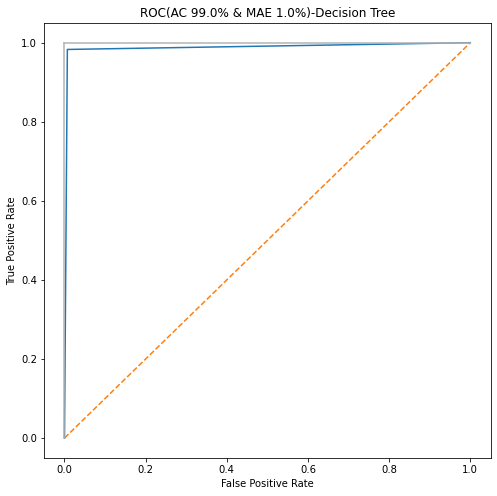

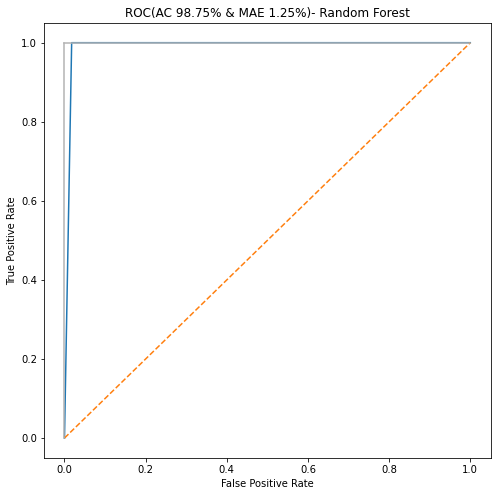

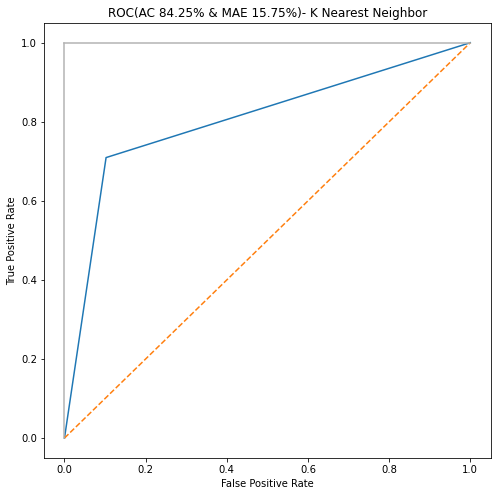

In [59]:
#Receiver Operating Characteristic
plt.subplots(1, figsize=(8,8))
plt.title("ROC(AC {}% & MAE {}%)-Decision Tree".format(DT_AC*100 , DT_MAE*100))
plt.plot(DT_false_positive_rate, DT_true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

plt.subplots(1, figsize=(8,8))
plt.title("ROC(AC {}% & MAE {}%)- Random Forest".format(RF_AC*100 , RF_MAE*100))
plt.plot(RF_false_positive_rate, RF_true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

plt.subplots(1, figsize=(8,8))
plt.title("ROC(AC {}% & MAE {}%)- K Nearest Neighbor".format(knn_ac*100 , knn_MAE*100))
plt.plot(knn_false_positive_rate, knn_true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()